In [1]:
import pandas as pd
import matplotlib.pyplot as plt
from PIL import Image
import os

In [2]:
llm_df = pd.read_csv('llm_result.tsv', sep='\t')
human_df = pd.read_csv('human_result.tsv', sep='\t')

In [3]:
show_correct = False
show_incorrect = True

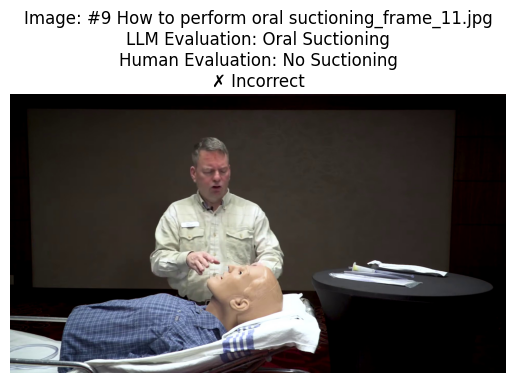

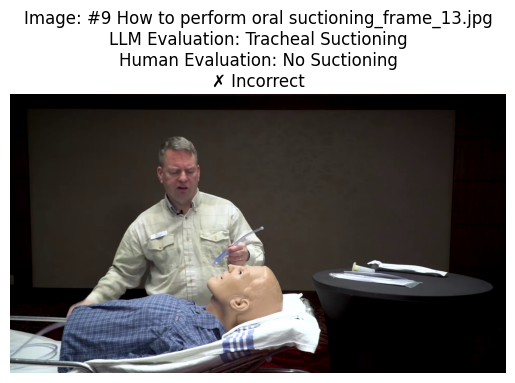

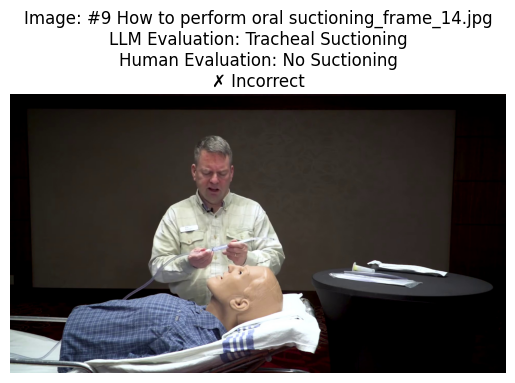

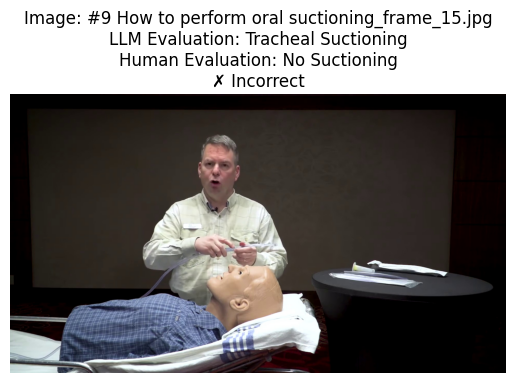

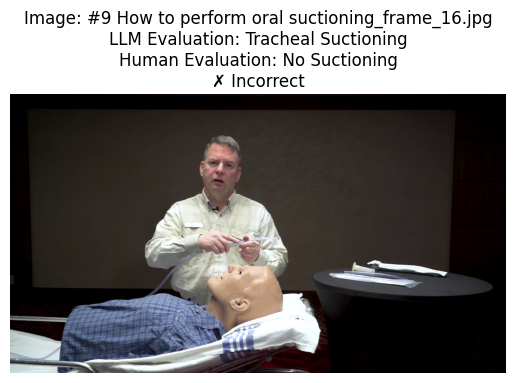

...

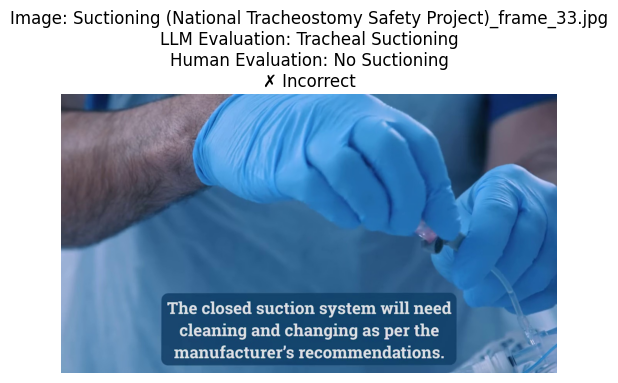

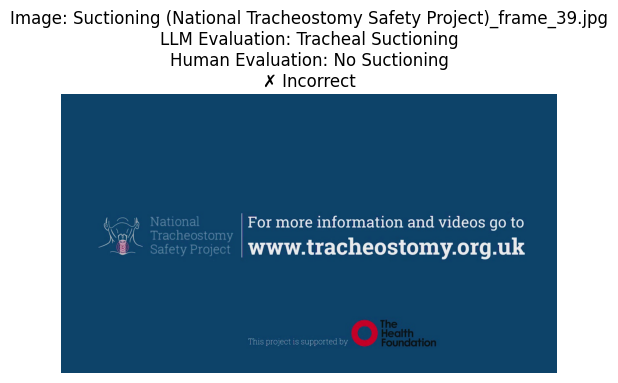

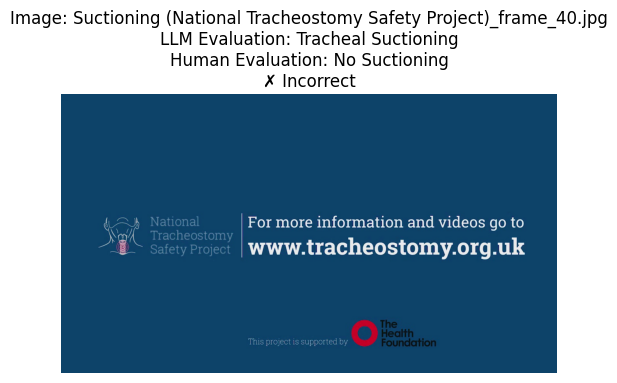

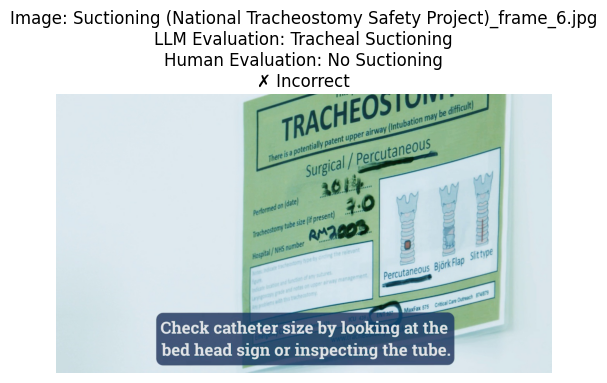

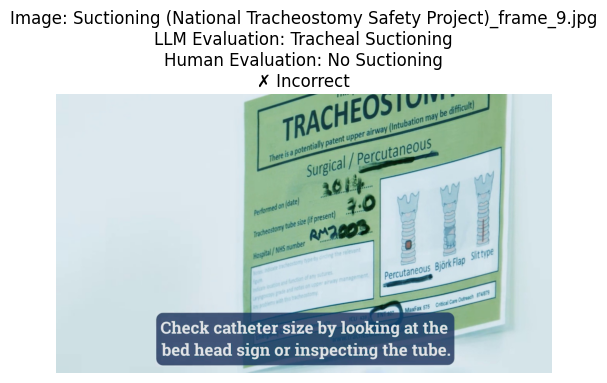

In [4]:
# Merge the dataframes on the Image column
merged_df = pd.merge(llm_df, human_df, on='Image', how='inner')

# Directory containing the images
image_dir = "frames"
# Iterate over each row in the merged dataframe
for index, row in merged_df.iterrows():
    image_name = row['Image']
    llm_eval = row['llm_evaluation']
    human_eval = row['human_evaluation']
    
    # Check if we should show this image based on correctness
    is_correct = llm_eval == human_eval
    if (is_correct and not show_correct) or (not is_correct and not show_incorrect):
        continue
        
    # Load and display the image
    image_path = os.path.join(image_dir, image_name)
    img = Image.open(image_path)
    
    plt.imshow(img)
    plt.axis('off')
    plt.title(f"Image: {image_name}\nLLM Evaluation: {llm_eval}\nHuman Evaluation: {human_eval}\n{'✓ Correct' if is_correct else '✗ Incorrect'}")
    plt.show()